# Демо-экзамен по курсу "Прикладной анализ данных". Вариант 1

Выполнил: Донецков Андрей Дмитриевич Б23-215

Название ВУЗа, в котором обучаетесь: НИЯУ МИФИ

Вставьте ниже скриншот с результатом вашего решения в Leaderboard на Kaggle: https://www.kaggle.com/competitions/where-are-the-seagulls

*Пример ниже:*

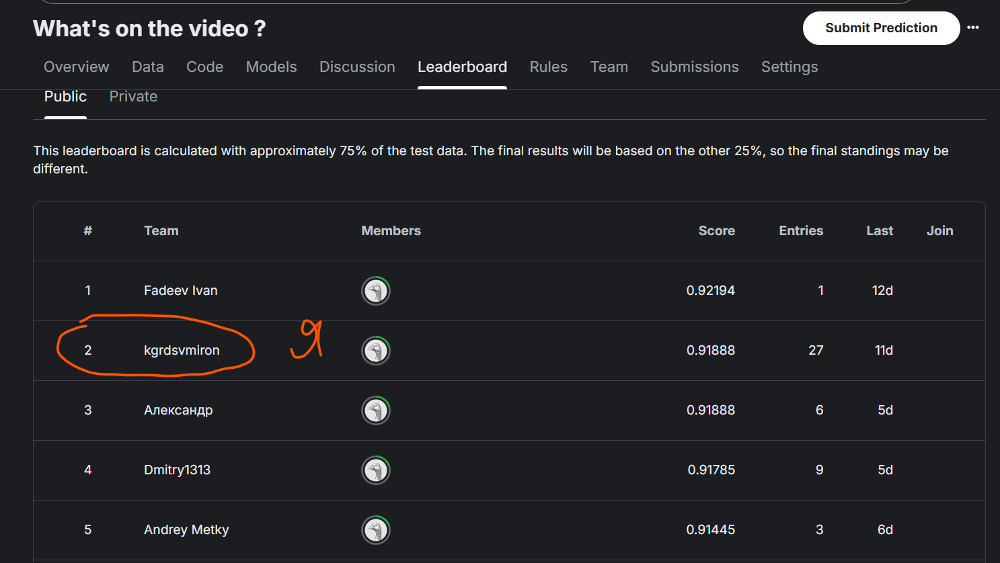

## 0. Описание задачи и данные

В 4 километрах от тихоокеанского берега Камчатки в бухте Вестник лежит остров Уташуд — часть Южно-Камчатского федерального заказника. На нем живут каланы, антуры, тюлени ларги, около 50 тысяч птиц десяти разных видов, включая  колонию топорика численностью 10 тыс. пар. В данной задаче нас интересуют двое обитатаелей острова – ларга и техоокеанская чайка, за которыми осуществляется наблюдение через фотоловушки в летний сезон.

На Уташуде находится репродуктивное лежбище тюленей-ларга  и одно из крупнейших на Камчатке поселений тихоокеанской чайки (4 тыс. пар). За 1 сезон наблюдения за этими животными может накопится более 1800 фотографий различного качества. Через эти фотографии инспекторы оценивают благополучие и численность животных.

Разработайте алгоритм, который бы позволил производить учет чаек и выделять их по фотографии.

Ссылка на соревнование и на данные: https://www.kaggle.com/competitions/where-are-the-seagulls

In [1]:
# Import libraries
# TODO

import os
import shutil
import random
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import cv2


Небольшая инструкция как напрямую скачать данные с kaggle в Colab ноутбук: https://www.geeksforgeeks.org/python/how-to-import-kaggle-datasets-directly-into-google-colab/

In [2]:
import opendatasets as od

url = 'https://www.kaggle.com/competitions/where-are-the-seagulls'
od.download(url)

Skipping, found downloaded files in "./where-are-the-seagulls" (use force=True to force download)


Создаем тренировучную и валидационную выборку из **train**

Воспользуемся следующей структурой:
```
data/
├── all_data/
│   ├── images/
│   └── labels/
└── test/
    └── images/
```

In [3]:
os.makedirs("where-are-the-seagulls/data/train", exist_ok=True)
shutil.move("where-are-the-seagulls/data/train", "where-are-the-seagulls/data/all_data")

'where-are-the-seagulls/data/all_data/train'

In [4]:
train_images_path = "where-are-the-seagulls/data/all_data/images/"
train_labels_path = "where-are-the-seagulls/data/all_data/labels/"
test_images_path = "where-are-the-seagulls/data/test/images/"

train_images_path_array = [train_images_path + entry.name for entry in os.scandir(train_images_path) if entry.is_file()]
train_labels_path_array = [train_labels_path + entry.name for entry in os.scandir(train_labels_path) if entry.is_file()]
test_images_path_array = [test_images_path + entry.name for entry in os.scandir(test_images_path) if entry.is_file()]

In [5]:
combined_list = []

for label_path in train_labels_path_array:
    if os.path.getsize(label_path) > 0:
        temp_df = pd.read_csv(label_path, header=None, sep='\s+')
        temp_df['file_name'] = label_path
        combined_list.append(temp_df)

label_df = pd.concat(combined_list, ignore_index=True)
label_df.columns = ['label', 'x_center', 'y_center', 'width', 'height', 'file_name']
label_df = label_df[['file_name', 'label', 'x_center', 'y_center', 'width', 'height']]

<>:5: SyntaxWarning: invalid escape sequence '\s'
<>:5: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_55958/3944526556.py:5: SyntaxWarning: invalid escape sequence '\s'
  temp_df = pd.read_csv(label_path, header=None, sep='\s+')


## 1. Провести предварительное исследование данных

- в каком формате вам предоставлены данные?
- какие есть особенности датасета?
- если необходимо произвести очистку и предварительную обработку данных.

### Глянем на соотношения.

In [6]:
print(len(train_images_path_array), len(test_images_path_array))

500 99


Можно и проще сделать вручную. Ну да ладно.

### Визуализируем ограничивающие прямоугольники.

In [7]:
# Посмотреть на изображения из папки
def look_images(imgage_path: str, resolutin: list) -> None:
    import imgviz

    num_samples = min(resolutin[0] * resolutin[1], len(imgage_path))
    sampled_paths = random.sample(imgage_path, num_samples)

    fig, axes = plt.subplots(resolutin[1], resolutin[0], figsize=(resolutin[0] * 4, resolutin[1] * 4))
    axes_flat = axes.flat

    for idx, ax in enumerate(axes_flat):
        if idx < num_samples:
            image = cv2.imread(sampled_paths[idx])
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            ax.imshow(image_rgb)
            ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

Посмотрим на 15 изображений из **train**.

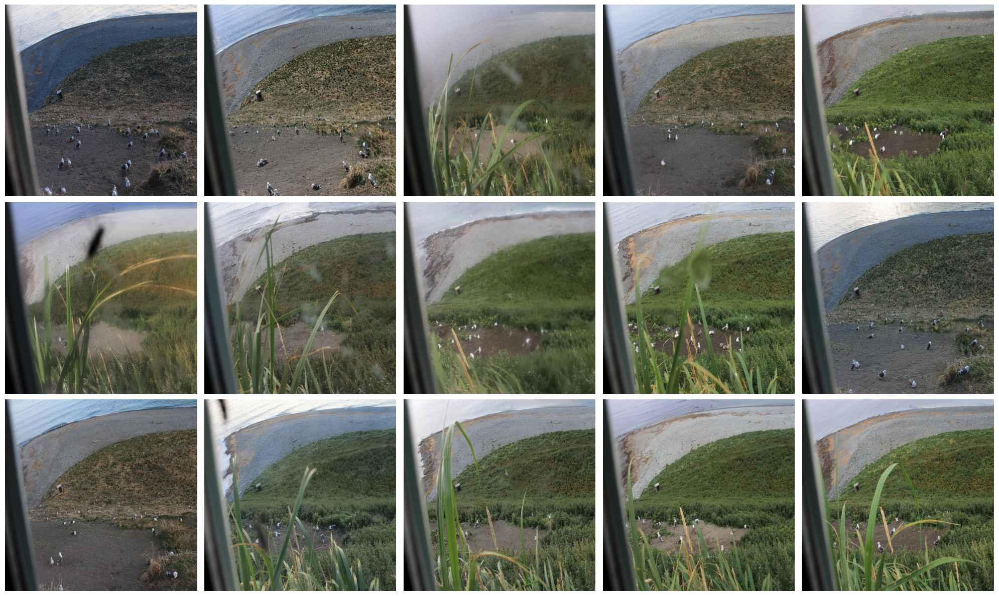

In [8]:
look_images(train_images_path_array, [5, 3])

Посмотрим на 15 изображений из **test**.

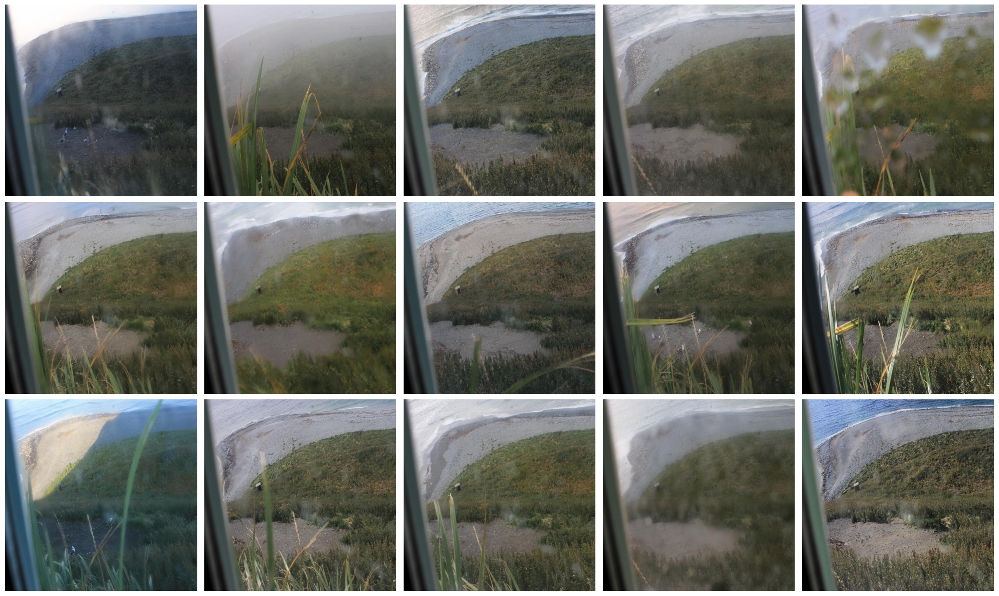

In [9]:
look_images(test_images_path_array, [5, 3])

Видно только чаек, где тюлени?

In [10]:
label_df

,file_name,label,x_center,y_center,width,height
0,where-are-the-seagulls/data/all_data/labels/20...,0,0.178125,0.648438,0.017188,0.032031
1,where-are-the-seagulls/data/all_data/labels/20...,0,0.178906,0.678906,0.029687,0.029687
2,where-are-the-seagulls/data/all_data/labels/20...,0,0.290625,0.697656,0.035937,0.028125
3,where-are-the-seagulls/data/all_data/labels/20...,0,0.364063,0.663281,0.027344,0.037500
4,where-are-the-seagulls/data/all_data/labels/20...,0,0.406250,0.771094,0.023438,0.066406
...,...,...,...,...,...,...
5381,where-are-the-seagulls/data/all_data/labels/20...,0,0.657813,0.666406,0.022656,0.058594
5382,where-are-the-seagulls/data/all_data/labels/20...,0,0.523438,0.721094,0.029687,0.050781
5383,where-are-the-seagulls/data/all_data/labels/20...,0,0.371094,0.653125,0.021094,0.036719
5384,where-are-the-seagulls/data/all_data/labels/20...,0,0.364063,0.697656,0.018750,0.026562


In [11]:
label_df["label"].unique()

array([0])

Значит разбираться будем только с чайками. Посмотрим на из расположение

<Figure size 640x480 with 0 Axes>

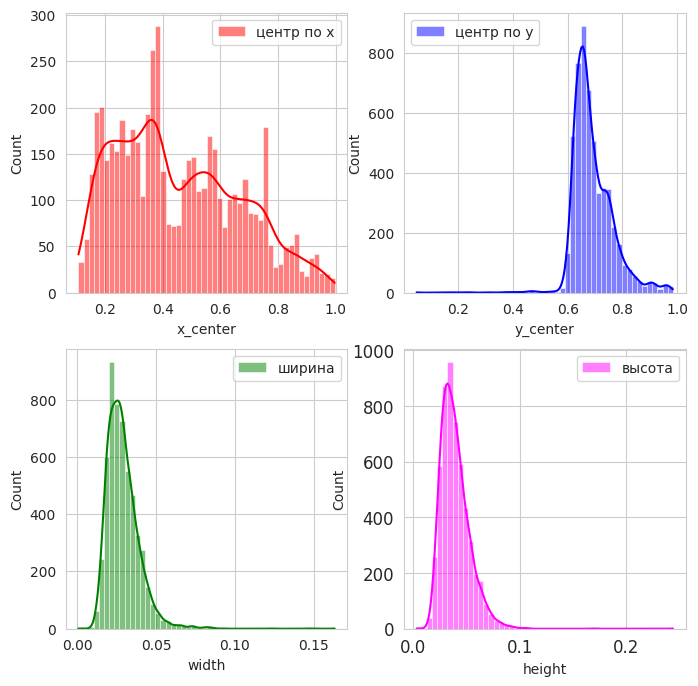

In [12]:
sns.set_style('whitegrid')
plt.figure()
fig, ax = plt.subplots(2, 2, figsize=(8, 8))

sns.histplot(label_df["x_center"], kde=True, bins=50, color="red", ax=ax[0, 0], label='центр по х')
sns.histplot(label_df["y_center"], kde=True, bins=50, color="blue", ax=ax[0, 1], label='центр по у')
sns.histplot(label_df["width"], kde=True, bins=50, color="green", ax=ax[1, 0], label='ширина')
sns.histplot(label_df["height"], kde=True, bins=50, color="magenta", ax=ax[1, 1], label='высота')

ax[0, 0].legend()
ax[0, 1].legend()
ax[1, 0].legend()
ax[1, 1].legend()

locs, labels = plt.xticks()
plt.tick_params(axis='both', which='major', labelsize=12)

plt.show()


Видно, что объекты (в будующем просто - чайки) распологаются внизу изображений и примерно одного размера, что логично из того, что у нас изображения одного и тогоже места, а чайки поодали под окном. Помторим на исключения.

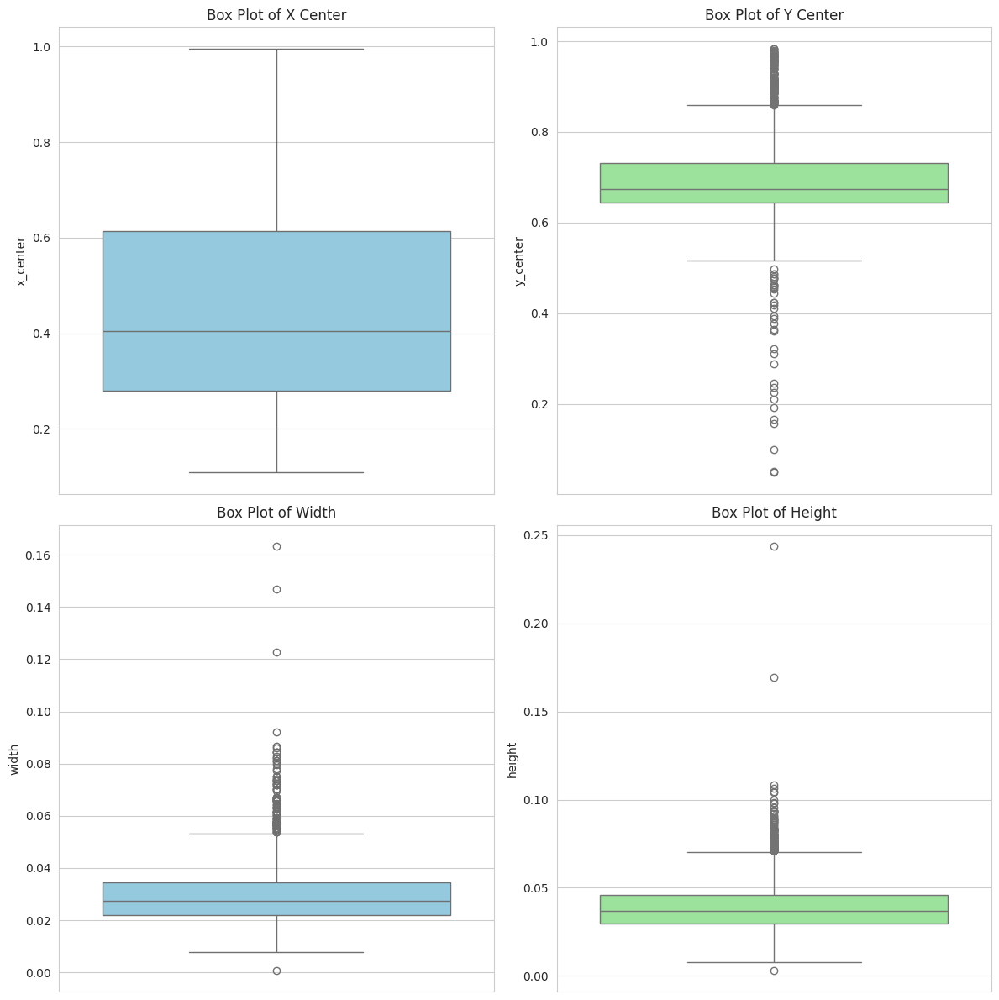

In [13]:
plt.figure(figsize=(12, 12))

plt.subplot(2, 2, 1)
sns.boxplot(y=label_df["x_center"], color='skyblue')
plt.title('Box Plot of X Center')

plt.subplot(2, 2, 2)
sns.boxplot(y=label_df["y_center"], color='lightgreen')
plt.title('Box Plot of Y Center')

plt.subplot(2, 2, 3)
sns.boxplot(y=label_df["width"], color='skyblue')
plt.title('Box Plot of Width')

plt.subplot(2, 2, 4)
sns.boxplot(y=label_df["height"], color='lightgreen')
plt.title('Box Plot of Height')

plt.tight_layout()
plt.show()

Выглядит интересно. По x исключений нет, по y все хаотично, а из размеров двух чаех можно догадаться, что они сели прям у окна.

Но в общем можно ожидать хорошую обучаемость нейронной сети. Приступим.

## 2. Подготовить данные для обучения

- Создать тренировочную и тестовую подвыборки для обучения и тестирования работы моделей
- Создать класс на фреймворке `PyTorch` для создания датасета
- Создать `loader` для передачи данных в модель нейронной сети

*P.s.: если вам удобнее использовать Keras или другой формат обработки данных и построения моделей, вы можете их использовать, не обязательно идти по пути `PyTorch` и `loader`.

Возможно вам это поможет: https://docs.ultralytics.com/datasets/detect/#ultralytics-yolo-format

In [14]:
def dynamic_split(split_ratio=0.8) -> None:
    import os
    import random
    from sklearn.model_selection import train_test_split
    import shutil

    # Config
    data_root = "where-are-the-seagulls/data"
    all_data_dir = os.path.join(data_root, "all_data/")
    train_dir = os.path.join(data_root, "train/")
    val_dir = os.path.join(data_root, "val/")
    test_dir = os.path.join(data_root, "test/")

    # Create new dirs with proper structure
    shutil.rmtree(train_dir, ignore_errors=True)
    shutil.rmtree(val_dir, ignore_errors=True)
    os.makedirs(os.path.join(train_dir, "images"))
    os.makedirs(os.path.join(train_dir, "labels"))
    os.makedirs(os.path.join(val_dir, "images"))
    os.makedirs(os.path.join(val_dir, "labels"))

    # List all images (only .jpg files)
    image_dir = os.path.join(all_data_dir, "images")
    all_images = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
    random.shuffle(all_images)

    # Split data
    train_files, val_files = train_test_split(
        all_images, 
        train_size=split_ratio,
        random_state=random.randint(0, 1000)
    )

    # Corrected file copying function
    def link_files(file_list, target_dir):
        for img_file in file_list:
            # Copy image
            src_img = os.path.join(all_data_dir, "images", img_file)
            dst_img = os.path.join(target_dir, "images", img_file)
            shutil.copy(src_img, dst_img)
            
            # Copy corresponding label
            label_file = img_file.replace(".jpg", ".txt")
            src_label = os.path.join(all_data_dir, "labels", label_file)  # FIX 1: Correct source path
            dst_label = os.path.join(target_dir, "labels", label_file)   # FIX 2: Correct destination path
            shutil.copy(src_label, dst_label)

    link_files(train_files, train_dir)
    link_files(val_files, val_dir)

In [15]:
dynamic_split()

## 3. Реализация модели

- создать класс для модели
- создать функцию для обучения модели
- создать функцию для валидации модели

In [16]:
from ultralytics import YOLO

# Load a pretrained YOLO model (recommended for training)
model = YOLO("yolo11n.pt")

# Train the model using the 'coco8.yaml' dataset for 3 epochs
results = model.train(data="dataset.yaml", epochs=50)

# Evaluate the model's performance on the validation set
results = model.val()

Ultralytics 8.3.162 🚀 Python-3.12.3 torch-2.7.1+cu126 CUDA:0 (NVIDIA GeForce RTX 4090, 24081MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train15, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained

train: Scanning /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/train/labels... 400 images, 27 backgrounds, 0 corrupt: 100%|██████████| 400/400 [00:00<00:00, 7461.38it/s]

train: /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/train/images/20200816_180222_01_JPG.rf.5f3bc87ff01f17b2a00c3ecf18d14ac5.jpg: 2 duplicate labels removed
train: /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/train/images/20200819_182328_01_JPG.rf.cca24be539aa73a24a2bf112ab67fe68.jpg: 3 duplicate labels removed
train: /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/train/images/20200910_185837_01_JPG.rf.cdf85cd8e98797d94fb93d972d58fc5f.jpg: 1 duplicate labels removed
train: /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/train/images/20200913_121758_01_JPG.rf.126b4bd798cd834f2c08f1c85a6fee70.jpg: 1 duplicate labels removed
train: /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/train/images/20200913_171925_01_JPG.rf.de1d151832416a3f2df30dcdbf84bf8a.jpg: 3 duplicate labels removed
train: /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/train/images

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2517.3±1655.7 MB/s, size: 61.7 KB)


val: Scanning /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/val/labels... 100 images, 5 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<00:00, 7503.36it/s]

val: New cache created: /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/val/labels.cache


Plotting labels to /home/andredon/projects/ADA/runs/detect/train15/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /home/andredon/projects/ADA/runs/detect/train15
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.44G      2.407       2.89       1.19        329        640: 100%|██████████| 25/25 [00:01<00:00, 18.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 16.61it/s]

                   all        100       1061     0.0254      0.718     0.0262    0.00915

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       2/50       2.9G      2.253      1.699      1.127        280        640: 100%|██████████| 25/25 [00:00<00:00, 25.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 20.59it/s]


                   all        100       1061     0.0179      0.505     0.0299    0.00886

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.92G      2.156      1.542      1.122        240        640: 100%|██████████| 25/25 [00:00<00:00, 26.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 21.93it/s]

                   all        100       1061     0.0289      0.818      0.357      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.93G       2.12      1.483      1.098        195        640: 100%|██████████| 25/25 [00:00<00:00, 27.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 19.43it/s]

                   all        100       1061      0.416      0.462      0.331      0.096

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       5/50      2.95G      2.122        1.4       1.09        320        640: 100%|██████████| 25/25 [00:00<00:00, 27.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 23.60it/s]

                   all        100       1061      0.696      0.637      0.682      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.96G      2.106      1.334      1.076        304        640: 100%|██████████| 25/25 [00:00<00:00, 27.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 22.52it/s]

                   all        100       1061      0.716      0.678      0.724      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.98G      2.103      1.314      1.086        318        640: 100%|██████████| 25/25 [00:00<00:00, 27.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 22.58it/s]

                   all        100       1061      0.759      0.684      0.747      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.99G      2.069      1.267      1.078        278        640: 100%|██████████| 25/25 [00:00<00:00, 27.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 23.25it/s]

                   all        100       1061      0.773      0.681      0.758      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.01G      2.043      1.237      1.092        263        640: 100%|██████████| 25/25 [00:00<00:00, 27.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 24.74it/s]

                   all        100       1061      0.735      0.705       0.75      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.02G      1.991      1.195      1.081        242        640: 100%|██████████| 25/25 [00:00<00:00, 27.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 25.13it/s]


                   all        100       1061      0.741       0.65      0.731      0.283

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.04G      2.067      1.208      1.071        185        640: 100%|██████████| 25/25 [00:00<00:00, 27.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 24.71it/s]

                   all        100       1061      0.757       0.68      0.733      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      3.05G      2.017       1.18      1.053        258        640: 100%|██████████| 25/25 [00:00<00:00, 27.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 24.91it/s]

                   all        100       1061      0.746      0.707       0.76      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.07G      2.035      1.195      1.095        226        640: 100%|██████████| 25/25 [00:00<00:00, 27.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 25.73it/s]

                   all        100       1061      0.827      0.712      0.779      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.08G      2.003       1.18      1.077        276        640: 100%|██████████| 25/25 [00:00<00:00, 27.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 24.94it/s]

                   all        100       1061      0.713      0.695      0.733      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50       3.1G      1.955      1.128      1.055        152        640: 100%|██████████| 25/25 [00:00<00:00, 27.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 25.78it/s]

                   all        100       1061      0.758      0.724      0.778      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      3.11G      1.968      1.132      1.065        242        640: 100%|██████████| 25/25 [00:00<00:00, 27.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 26.65it/s]

                   all        100       1061      0.776      0.693      0.778      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.13G      1.989      1.092      1.058        250        640: 100%|██████████| 25/25 [00:00<00:00, 27.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 26.18it/s]

                   all        100       1061      0.745      0.697      0.765      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      3.33G      2.013      1.131       1.07        217        640: 100%|██████████| 25/25 [00:00<00:00, 27.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 26.87it/s]

                   all        100       1061      0.774      0.712      0.771      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.35G      1.935      1.082      1.046        186        640: 100%|██████████| 25/25 [00:00<00:00, 27.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 26.93it/s]

                   all        100       1061       0.73      0.677      0.753      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.36G      1.941      1.078      1.053        157        640: 100%|██████████| 25/25 [00:00<00:00, 27.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 26.53it/s]


                   all        100       1061      0.807      0.734      0.814      0.355

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.38G      1.898      1.053      1.028        215        640: 100%|██████████| 25/25 [00:00<00:00, 27.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 26.50it/s]

                   all        100       1061      0.785      0.725      0.793      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.39G      1.934      1.077      1.063        172        640: 100%|██████████| 25/25 [00:00<00:00, 27.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.18it/s]

                   all        100       1061      0.778      0.723      0.788      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.41G      1.929      1.072      1.056        266        640: 100%|██████████| 25/25 [00:00<00:00, 27.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 26.97it/s]

                   all        100       1061      0.781      0.676      0.765      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.42G      1.914      1.065       1.05        237        640: 100%|██████████| 25/25 [00:00<00:00, 27.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.29it/s]

                   all        100       1061      0.793       0.73      0.799      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.44G      1.901       1.02      1.049        177        640: 100%|██████████| 25/25 [00:00<00:00, 27.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 26.23it/s]

                   all        100       1061      0.815       0.75      0.816      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      3.45G      1.907      1.014      1.047        233        640: 100%|██████████| 25/25 [00:00<00:00, 27.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 26.98it/s]

                   all        100       1061      0.802       0.77      0.814      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.47G      1.885      1.016      1.029        237        640: 100%|██████████| 25/25 [00:00<00:00, 27.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.43it/s]

                   all        100       1061       0.84      0.749      0.822      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.48G      1.857     0.9868      1.042        244        640: 100%|██████████| 25/25 [00:00<00:00, 26.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 26.75it/s]


                   all        100       1061      0.828       0.76      0.837      0.379

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50       3.5G      1.856     0.9743      1.031        213        640: 100%|██████████| 25/25 [00:00<00:00, 27.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.04it/s]

                   all        100       1061      0.822      0.743       0.82      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.71G       1.89      0.982      1.029        429        640: 100%|██████████| 25/25 [00:00<00:00, 27.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.27it/s]

                   all        100       1061      0.837      0.756      0.826       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      3.72G      1.869     0.9957       1.04        215        640: 100%|██████████| 25/25 [00:00<00:00, 27.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.10it/s]

                   all        100       1061      0.793      0.721      0.803      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      3.74G      1.863     0.9901      1.033        205        640: 100%|██████████| 25/25 [00:00<00:00, 26.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.21it/s]


                   all        100       1061      0.829      0.778      0.826      0.373

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      3.75G      1.859     0.9586      1.031        374        640: 100%|██████████| 25/25 [00:00<00:00, 27.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.46it/s]

                   all        100       1061       0.83      0.748      0.821      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      3.77G      1.839     0.9468      1.014        303        640: 100%|██████████| 25/25 [00:00<00:00, 27.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.26it/s]

                   all        100       1061      0.828      0.781      0.831      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      3.78G      1.844     0.9501      1.018        389        640: 100%|██████████| 25/25 [00:00<00:00, 27.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 26.44it/s]

                   all        100       1061      0.836      0.773      0.836      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      3.79G      1.837     0.9666       1.01        149        640: 100%|██████████| 25/25 [00:00<00:00, 26.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.48it/s]

                   all        100       1061      0.826      0.781      0.842      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      3.81G      1.798     0.9308      1.032        204        640: 100%|██████████| 25/25 [00:00<00:00, 27.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.24it/s]

                   all        100       1061      0.817      0.798      0.845      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      3.82G      1.819     0.9466      1.015        338        640: 100%|██████████| 25/25 [00:00<00:00, 27.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.59it/s]

                   all        100       1061      0.816      0.767      0.827      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.84G      1.764     0.9171          1        238        640: 100%|██████████| 25/25 [00:00<00:00, 27.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.07it/s]

                   all        100       1061      0.827      0.758      0.831      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      3.86G      1.803     0.9267      1.014        270        640: 100%|██████████| 25/25 [00:00<00:00, 26.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.95it/s]

                   all        100       1061      0.827      0.771      0.827      0.388


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.87G       1.79     0.8996      1.056        151        640: 100%|██████████| 25/25 [00:01<00:00, 23.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.55it/s]

                   all        100       1061       0.85      0.771      0.846      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.88G      1.771     0.8967      1.043        188        640: 100%|██████████| 25/25 [00:00<00:00, 28.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.14it/s]

                   all        100       1061      0.832      0.787      0.833      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50       3.9G      1.737     0.9013      1.036        128        640: 100%|██████████| 25/25 [00:00<00:00, 28.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.29it/s]

                   all        100       1061       0.84       0.78      0.845      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.91G      1.759     0.8886      1.032        132        640: 100%|██████████| 25/25 [00:00<00:00, 28.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.17it/s]

                   all        100       1061      0.844      0.779      0.851      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.93G      1.737     0.8663       1.04        115        640: 100%|██████████| 25/25 [00:00<00:00, 28.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.31it/s]

                   all        100       1061      0.837        0.8      0.849      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.95G      1.748     0.8819      1.035        187        640: 100%|██████████| 25/25 [00:00<00:00, 28.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.40it/s]

                   all        100       1061       0.83      0.782      0.841      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.96G      1.739     0.8708      1.023        213        640: 100%|██████████| 25/25 [00:00<00:00, 28.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.66it/s]

                   all        100       1061      0.837      0.794      0.849      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.97G       1.74     0.8744       1.04        137        640: 100%|██████████| 25/25 [00:00<00:00, 28.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.02it/s]

                   all        100       1061      0.844      0.786      0.849      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.99G      1.722     0.8625      1.032        198        640: 100%|██████████| 25/25 [00:00<00:00, 28.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.83it/s]

                   all        100       1061      0.846      0.778      0.849      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50         4G      1.708     0.8509      1.028        244        640: 100%|██████████| 25/25 [00:00<00:00, 28.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 27.31it/s]

                   all        100       1061      0.823      0.794       0.85      0.395



50 epochs completed in 0.016 hours.
Optimizer stripped from /home/andredon/projects/ADA/runs/detect/train15/weights/last.pt, 5.5MB
Optimizer stripped from /home/andredon/projects/ADA/runs/detect/train15/weights/best.pt, 5.5MB

Validating /home/andredon/projects/ADA/runs/detect/train15/weights/best.pt...
Ultralytics 8.3.162 🚀 Python-3.12.3 torch-2.7.1+cu126 CUDA:0 (NVIDIA GeForce RTX 4090, 24081MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.21it/s]


                   all        100       1061      0.844      0.786       0.85      0.399
Speed: 0.1ms preprocess, 0.4ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /home/andredon/projects/ADA/runs/detect/train15
Ultralytics 8.3.162 🚀 Python-3.12.3 torch-2.7.1+cu126 CUDA:0 (NVIDIA GeForce RTX 4090, 24081MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 5748.9±1841.3 MB/s, size: 56.9 KB)


val: Scanning /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/val/labels.cache... 100 images, 5 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  8.36it/s]


                   all        100       1061       0.84      0.784      0.849      0.399
Speed: 0.6ms preprocess, 1.3ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to /home/andredon/projects/ADA/runs/detect/train152


## 4. Обучение модели
*   Определить необходимые параметры для обучения модели (learning rate, optimizer, loss function, etc)
*   Реализовать процесс обучения модели
*   Оценить эффективность работы модели



## 5. Экспериментальная часть

- протестировать не менее 3х разных моделей для решения задачи
- сравнить их эффективность (по метрикам и потерям)
- сделать выводы

In [17]:
results = model.predict("where-are-the-seagulls/data/test/images", save=True, save_txt=True)


image 1/99 /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/test/images/20200928_150507_01_JPG.rf.109359154a680b75a67dce1e82062e55.jpg: 640x640 (no detections), 1.8ms
image 2/99 /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/test/images/20200928_160525_01_JPG.rf.50f3289f065a9a4f5372ffa3df9e7265.jpg: 640x640 (no detections), 1.7ms
image 3/99 /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/test/images/20200928_180600_01_JPG.rf.df87e688ee0e009c3a06572a4997cf81.jpg: 640x640 (no detections), 1.7ms
image 4/99 /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/test/images/20200929_081017_01_JPG.rf.c0e8134223d6ed61ac5187cc29495bd9.jpg: 640x640 (no detections), 1.8ms
image 5/99 /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/test/images/20200929_091035_01_JPG.rf.cc0f7b275eb3a5dd680df0011fa46c36.jpg: 640x640 (no detections), 2.1ms
image 6/99 /home/andredon/projects/ADA/Homework_final/

In [ ]:
results

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'seagulls'}
 obb: None
 orig_img: array([[[ 80,  77,  72],
         [ 83,  80,  75],
         [ 86,  83,  79],
         ...,
         [190, 179, 171],
         [192, 179, 171],
         [191, 178, 170]],
 
        [[ 80,  77,  72],
         [ 82,  79,  74],
         [ 86,  83,  79],
         ...,
         [192, 181, 173],
         [193, 180, 172],
         [192, 179, 171]],
 
        [[ 80,  77,  72],
         [ 82,  79,  74],
         [ 86,  83,  79],
         ...,
         [193, 182, 174],
         [192, 181, 173],
         [192, 181, 173]],
 
        ...,
 
        [[  0,   0,   0],
         [  0,   0,   0],
         [  0,   0,   0],
         ...,
         [ 29,  50,  48],
         [ 27,  49,  47],
         [ 27,  49,  47]],
 
        [[  0,   0,   0],
         [  0,   0,   0],
         [  0,   0,   0],
         ...,
         [ 32,  

In [38]:
detections = []
for result in results:
    # Extract filename from path
    file_name = os.path.basename(result.path)
    
    # Initialize bbox string
    bbox_str = ""
    
    # Process detections if any exist
    if len(result.boxes) > 0:
        # Get normalized coordinates (xywhn)
        boxes_norm = result.boxes.xywhn.cpu().numpy()
        class_ids = result.boxes.cls.cpu().numpy().astype(int)
        
        # Build bbox string
        box_strings = []
        for i in range(len(boxes_norm)):
            box = boxes_norm[i]
            box_strings.append(f"{class_ids[i]} {box[0]:.6f} {box[1]:.6f} {box[2]:.6f} {box[3]:.6f}")
        bbox_str = " ".join(box_strings)
    else:
        bbox_str = "-1"
    
    detections.append({
        "file_name": file_name,
        "bbox": bbox_str
    })

# Create DataFrame
df = pd.DataFrame(detections)


In [43]:
df = df.reset_index()
df

,index,file_name,bbox
0,0,20200928_150507_01_JPG.rf.109359154a680b75a67d...,-1
1,1,20200928_160525_01_JPG.rf.50f3289f065a9a4f5372...,-1
2,2,20200928_180600_01_JPG.rf.df87e688ee0e009c3a06...,-1
3,3,20200929_081017_01_JPG.rf.c0e8134223d6ed61ac51...,-1
4,4,20200929_091035_01_JPG.rf.cc0f7b275eb3a5dd680d...,-1
...,...,...,...
94,94,20201011_163823_01_JPG.rf.e2a5508980ce1a7009ec...,-1
95,95,20201011_173839_01_JPG.rf.078741d81a9f4e1427dd...,-1
96,96,20201012_074301_01_JPG.rf.aeea80a57963913c15a9...,-1
97,97,20201012_084317_01_JPG.rf.1628fe9f8845551f938c...,-1


In [46]:
df.to_csv("submission.csv", index=False)